In [ ]:
from word_generation import get_random_sea_floor,draw_sea_floor

In [1]:
Z = get_random_sea_floor(10)

NameError: name 'get_random_sea_floor' is not defined

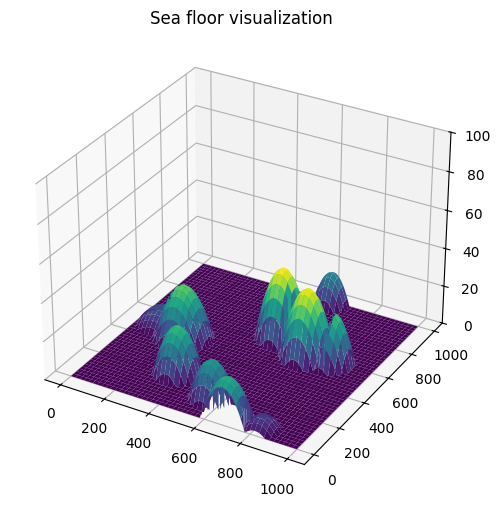

In [ ]:
draw_sea_floor(Z)

In [ ]:
import numpy as np
import random
import plotly.graph_objects as go
from submarine import place_shipwreck, Submarine, simulate_search

N = 1000
Z = get_random_sea_floor(10) 
wreck_pos = place_shipwreck(Z)

max_hill = np.max(Z)

wreck_pos = place_shipwreck(Z)

subs = []
for _ in range(3):
    x = random.randint(0, N-1)
    y = random.randint(0, N-1)
    altitude = max_hill + 20
    subs.append(Submarine(x, y, altitude, speed=2.0))

history = simulate_search(Z, wreck_pos, subs,
                          time_steps=20000,
                          detect_threshold=0.2)

paths_x = [[] for _ in subs]
paths_y = [[] for _ in subs]
paths_z = [[] for _ in subs]

x_w, y_w, z_w = wreck_pos

for step_data in history:
    for i, data in enumerate(step_data):
        px, py, pz = data['pos']
        paths_x[i].append(px)
        paths_y[i].append(py)
        paths_z[i].append(pz)

step = 1
x_coords = np.arange(0, N)
y_coords = np.arange(0, N)
X, Y = np.meshgrid(x_coords, y_coords)

fig = go.Figure()

fig.add_trace(go.Surface(
    x=X,
    y=Y,
    z=Z,
    name='Sea Floor'
))

for i in range(len(subs)):
    fig.add_trace(go.Scatter3d(
        x=paths_x[i],
        y=paths_y[i],
        z=paths_z[i],
        mode='lines',
        line=dict(width=4),
        name=f"Submarine {i+1}"
    ))

fig.add_trace(go.Scatter3d(
    x=[x_w], y=[y_w], z=[z_w+1],
    mode='markers',
    marker=dict(symbol='x', size=8, color='red'),
    name='Shipwreck'
))

fig.update_layout(
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Z',
        zaxis=dict(range=[0, 100])
    ),
    width=900,
    height=700
)

fig.show()
